In [ ]:
"""
PROGETTO DI IMAGE CAPTIONING

Questo codice implementa un modello di deep learning per generare descrizioni per sketch.
Il modello utilizza una combinazione di Reti Neurali Convoluzionali (CNN) per l'estrazione delle feature delle immagini
e una LTSM per la generazione del testo.

Il codice esegue i seguenti passaggi principali:
1. Estrazione delle feature delle Immagini: Estrae le feature dalle immagini dei disegni utilizzando un modello CNN pretrained chiamata VGG16.
2. Preprocessing del Testo: Pulisce il testo delle descrizioni e ne fa una tokenizzazione
3. Training del Modello: Definisce e allena un modello utilizzando le feature estratte dalle immagini e i dati di testo preprocessati.
4. Valutazione del Modello: Valuta il modello addestrato utilizzando diverse Score per valutare la qualità delle descrizioni.
5. Generazione di Caption: Genera descrizioni per nuove immagini di disegni utilizzando il modello addestrato.

Autore: Tommaso Senatori
"""

###Import Libraries and Dataset

In [ ]:
import re  # Import the re module for regular expressions
import numpy as np
import os
import pickle
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences # padding for words per phrase
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Input, Dense, SimpleRNN, Embedding, Dropout, add
from keras.optimizers import Adam

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
BASE_DIR = "/content/drive/MyDrive/Tirocinio/Datasets/flickr8k"
WORKING_DIR = "/content/drive/MyDrive/Tirocinio/f8k_ind"

###Feature Extraction

553467096/553467096 [==============================] - 6s 0us/step
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                            

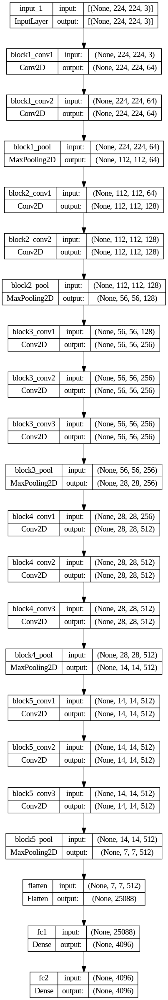

In [ ]:
model = VGG16()
model = Model(inputs=model.inputs, outputs=model.layers[-2].output) # remove last layer
# summary e plot
print(model.summary())
plot_model(model, show_shapes=True)

In [ ]:
# feature extraction dalle immagini: creo un dictionary (key,value) = (image_id,features)
features = {}
directory = os.path.join(BASE_DIR, 'Images')

for img_name in tqdm(os.listdir(directory)): # for each image in 'Images' directory
    # load image from file
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size=(224, 224)) # VGG expects 224x224 input
    # convert image pixels to a numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2])) # WHAT SHAPE BEFORE AND AFTER??
    # preprocess image for VGG16
    image = preprocess_input(image) # normalization e altro
    # estraggo le features
    feature = model.predict(image, verbose=0) # feature = output of the VGG16
    # get image id
    image_id = img_name.split('.')[0] # image_id = image name without .jpg
    # map image_ids to featrues
    features[image_id] = feature # features[key] = value

  0%|          | 0/8091 [00:00<?, ?it/s]

In [ ]:
# save features in pickle
pickle.dump(features, open(os.path.join(WORKING_DIR, 'features_ind.pkl'), 'wb'))

In [ ]:
# load features from pickle
features = pickle.load(open(os.path.join(WORKING_DIR, 'features_ind.pkl'),"rb"))

###Load captions data

In [ ]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f) # skip first line
    captions_doc = f.read()

In [ ]:
# creo un dictionary (key,value) = (image_id,captions)
mapping = {}
for line in tqdm(captions_doc.split('\n')): # per ogni caption in 'captions.txt'
    # split the line by comma(,)
    tokens = line.split(',') # tokens[0]=image_id, tokens[1]=caption
    if len(line) < 2: continue # skip invalid (too short) lines
    image_id, caption = tokens[0], tokens[1:] # eccolo
    #tolgo estensione .jpg da image_id
    image_id = image_id.split('.')[0]
    # converto la list delle caption in una singola string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # store the captions with that image_id
    mapping[image_id].append(caption)


  0%|          | 0/40456 [00:00<?, ?it/s]

In [ ]:
len(mapping) # should be 8091

8091

###Preprocess text data

In [ ]:
def clean(mapping):
    for key, captions in mapping.items(): # per ogni image_id e lista di captions associata
        for i in range(len(captions)):
            # prendo 1 caption per volta
            caption = captions[i]
            # preprocessing steps:
            # lowercase
            caption = caption.lower()
            # cancello caratteri non alfanumerici o spazi
            caption = re.sub(r'[^\w\s]', '', caption)
            # cancello spazi aggiuntivi
            caption = re.sub(r'\s+', ' ', caption)
            # aggiungo i tag 'startseq' e 'endseq' per ogni caption (e rimuovo parole più piccole di 2 lettere)
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [ ]:
# before preprocess of text
mapping['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
# cleaning text
clean(mapping)
# after preprocess of text
mapping['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

In [ ]:
# from mapping (dict) to all_captions (list)
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [ ]:
len(all_captions) # 5 captions per image

40455

In [ ]:
all_captions[:10]

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tricolored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq']

In [ ]:
# tokenize the text (create vocabulary, assigning an index per each word)
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1 # tot number of unique words
print(vocab_size)

8811


In [ ]:
tokenizer.word_index # the lower the integer assigned to a word, the more the frequency in the captions

{'startseq': 1,
 'endseq': 2,
 'in': 3,
 'the': 4,
 'on': 5,
 'is': 6,
 'and': 7,
 'dog': 8,
 'with': 9,
 'man': 10,
 'of': 11,
 'two': 12,
 'white': 13,
 'black': 14,
 'boy': 15,
 'are': 16,
 'woman': 17,
 'girl': 18,
 'to': 19,
 'wearing': 20,
 'at': 21,
 'people': 22,
 'water': 23,
 'red': 24,
 'young': 25,
 'brown': 26,
 'an': 27,
 'his': 28,
 'blue': 29,
 'dogs': 30,
 'running': 31,
 'through': 32,
 'playing': 33,
 'while': 34,
 'down': 35,
 'shirt': 36,
 'standing': 37,
 'ball': 38,
 'little': 39,
 'grass': 40,
 'child': 41,
 'person': 42,
 'snow': 43,
 'jumping': 44,
 'over': 45,
 'front': 46,
 'three': 47,
 'sitting': 48,
 'holding': 49,
 'field': 50,
 'small': 51,
 'up': 52,
 'by': 53,
 'large': 54,
 'green': 55,
 'group': 56,
 'one': 57,
 'yellow': 58,
 'her': 59,
 'walking': 60,
 'children': 61,
 'men': 62,
 'into': 63,
 'air': 64,
 'beach': 65,
 'near': 66,
 'mouth': 67,
 'jumps': 68,
 'another': 69,
 'for': 70,
 'street': 71,
 'runs': 72,
 'its': 73,
 'from': 74,
 'riding'

In [ ]:
# get maximum length of the caption available (to do padding)
max_length = max(len(caption.split()) for caption in all_captions)
max_length

34

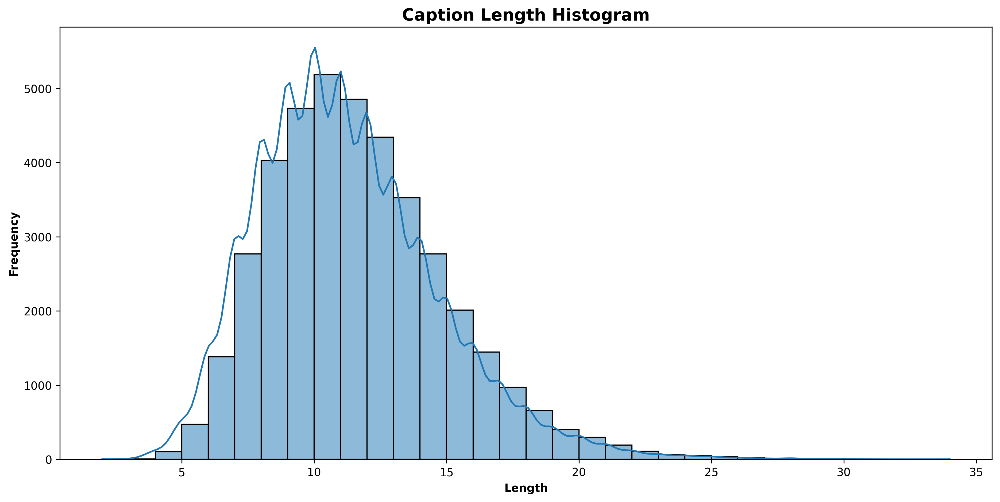

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_caption_lengths(captions):
    # dimensione e risoluzione
    plt.figure(figsize=(15, 7), dpi=300) # dotsperinch (resolution)

    # lista con length per ogni caption
    caption_lengths = [len(caption.split()) for caption in captions]

    # plot istogramma
    sns.histplot(x=caption_lengths, kde=True, binwidth=1)

    # Set plot titles and labels
    plt.title('Caption Length Histogram', fontsize=15, fontweight='bold')
    plt.xlabel('Length', fontweight='bold')
    plt.ylabel('Frequency', fontweight='bold')

    # Show the plot
    plt.show()

# eseguo
plot_caption_lengths(all_captions)

###Train Test Split

In [ ]:
image_ids = list(mapping.keys())

split = int(len(image_ids) * 0.80)
train = image_ids[:split]
remaining = image_ids[split:]

# Divido le immagini restanti a metà tra validation set e test set
split2 = len(remaining) // 2
val = remaining[:split2]
test = remaining[split2:]

# Verify the sizes of the splits
print("Train set size:", len(train))
print("Validation set size:", len(val))
print("Test set size:", len(test))

Train set size: 6472
Validation set size: 809
Test set size: 810


In [ ]:
# startseq girl going into wooden building endseq

#      X                                           y
#   startseq                                     girl
#   startseq girl                                going
#   startseq girl going                          into
#   ..................................................
#   startseq girl going into wooden building     endseq

In [ ]:
# creo data generator per dividire i dati in batch (evita il session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    X1, X2, y = list(), list(), list() #((3402, 4096), (3402, 34), (3402, 8811))
    n = 0
    while 1:
        for key in data_keys: # for each image_id
            n+=1
            captions = mapping[key]
            # processo ogni caption
            for caption in captions: # per ogni caption con lo stesso image_id
                # encode the sequence: we get an index for each word
                seq = tokenizer.texts_to_sequences([caption])[0]
                # splitto la sequenza in coppie X,y
                for i in range(1, len(seq)):
                    # split into input and output paths
                    in_seq, out_seq = seq[:i], seq[i]
                    # padding of input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # one hot encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]

                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size: # reset per evitare un crash
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

In [ ]:
# You can check the shape of the input and output for your model

gen = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size=64)

# Get a batch of data from the generator
X, y = next(gen)

# Print the shape of X1, X2, and y
X1, X2 = X
print("Shape of X1:", X1.shape)
print("Shape of X2:", X2.shape)
print("Shape of y:", y.shape)

Shape of X1: (3402, 4096)
Shape of X2: (3402, 34)
Shape of y: (3402, 8811)


###Model Creation

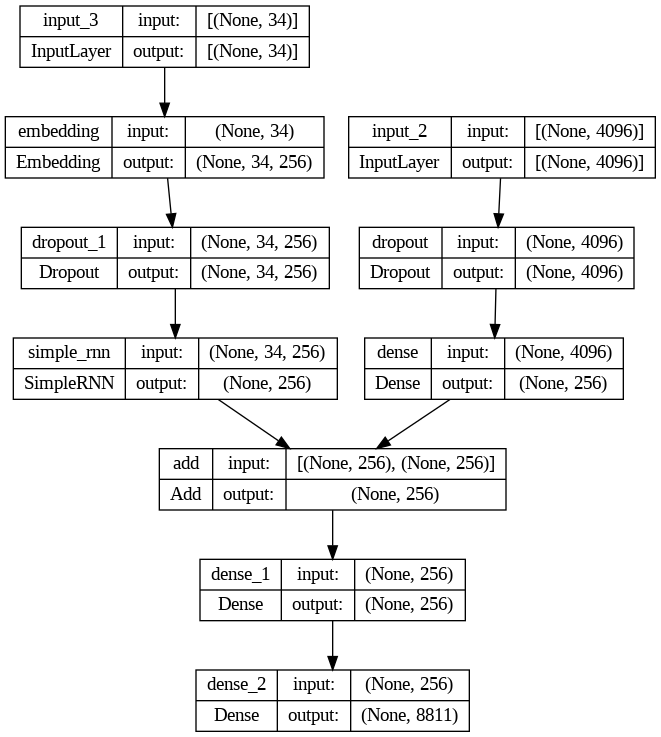

In [ ]:
# ENCODER MODEL

# image feature model                                  RIGHT
inputs1 = Input(shape=(4096,)) # input: VGG16 output (4096)
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# sequence feature  (captions) layers                   LEFT
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = SimpleRNN(256)(se2)

# DECODER MODEL
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.001))

# plot model
plot_model(model, show_shapes=True) # to use plot_model, install graphviz (https://gitlab.com/graphviz/graphviz/-/releases) and also anaconda


###Train the model

In [ ]:
losses = []
val_losses = []
epochs = 10
batch_size = 64
steps = len(train) // batch_size
val_steps = len(val) // batch_size

for i in range(epochs):
    # Create data generator for training set
    train_generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # Create data generator for validation set
    val_generator = data_generator(val, mapping, features, tokenizer, max_length, vocab_size, batch_size)

    # Fit the model for 1 epoch
    history = model.fit(train_generator, epochs=1, steps_per_epoch=steps, validation_data=val_generator,
                        validation_steps=val_steps, verbose=1)

    # Store the losses for this epoch
    losses.append(history.history['loss'][0])
    val_losses.append(history.history['val_loss'][0])

    # Save the model at the 5th epoch
    if i == 4: model.save(WORKING_DIR + '/MODEL_5IND.h5')

101/101 [==============================] - 51s 510ms/step - loss: 3.2840 - val_loss: 3.9655


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


101/101 [==============================] - 51s 502ms/step - loss: 2.7004 - val_loss: 4.0874


In [ ]:
# Load the pre-trained model
model = load_model(WORKING_DIR + '/MODEL_10IND.h5')

# Load the pre-saved losses
with open(os.path.join(WORKING_DIR, 'losses_10ind.pkl'), 'rb') as f:
    losses = pickle.load(f)
with open(os.path.join(WORKING_DIR, 'vlosses_10ind.pkl'), 'rb') as f:
    val_losses = pickle.load(f)

epochs = 5
batch_size = 64
steps = len(train) // batch_size
val_steps = len(val) // batch_size

for i in range(epochs):
    # Create data generator for training set
    train_generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # Create data generator for validation set
    val_generator = data_generator(val, mapping, features, tokenizer, max_length, vocab_size, batch_size)

    # Fit the model for 1 epoch with early stopping
    history = model.fit(train_generator, epochs=1, steps_per_epoch=steps, validation_data=val_generator,
                        validation_steps=val_steps, verbose=1)

    # Store the losses for this epoch
    losses.append(history.history['loss'][0])
    val_losses.append(history.history['val_loss'][0])

101/101 [==============================] - 56s 554ms/step - loss: 2.4336 - val_loss: 4.2437


In [ ]:
# Save losses
with open(os.path.join(WORKING_DIR, 'losses_15ind.pkl'), 'wb') as f:
    pickle.dump(losses, f)
with open(os.path.join(WORKING_DIR, 'vlosses_15ind.pkl'), 'wb') as f:
    pickle.dump(val_losses, f)

In [ ]:
# Load losses
with open(os.path.join(WORKING_DIR, 'losses_15ind.pkl'), 'rb') as f:
    losses = pickle.load(f)
with open(os.path.join(WORKING_DIR, 'vlosses_15ind.pkl'), 'rb') as f:
    val_losses = pickle.load(f)

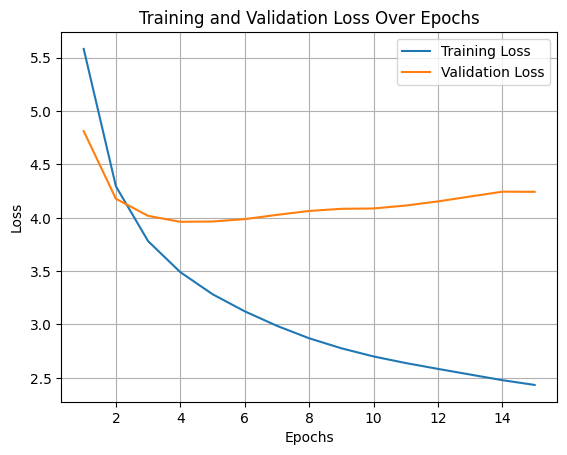

In [ ]:
def plot_loss(losses, val_losses):
    epochs = len(losses)
    plt.plot(range(1, epochs + 1), losses, label='Training Loss')
    plt.plot(range(1, epochs + 1), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss Over Epochs')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_loss(losses, val_losses)


In [ ]:
# save the model
model.save(WORKING_DIR + '/MODEL_5IND.h5')

In [ ]:
# load the model
model = load_model(WORKING_DIR + '/MODEL_5IND.h5')

###Generate captions for the image

In [ ]:
def idx_to_word(integer, tokenizer): # rida la parola a cui corrisponde l'integer
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
# generate caption for an image
def predict_caption(model, image_features, tokenizer, max_length):
    # aggiungo lo start tag
    in_text = 'startseq'
    # per ogni parola (caption non più lunga di max_length)
    for i in range(max_length):
        # encode input sequence (convert words to integers)
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict the next word
        yhat = model.predict([image_features, sequence], verbose=0)
        # get index with highest probability
        yhat = np.argmax(yhat)
        # convert predicted index to a word
        word = idx_to_word(yhat, tokenizer)
        # stop if word is not found
        if word is None: break
        # else : append word as input for generating next word
        in_text += " " + word
        # stop se raggiungiamo l'end tag
        if word == 'endseq': break
    return in_text

###Calculate BLEU Score

In [ ]:
from nltk.translate.bleu_score import corpus_bleu

actual, predicted = list(), list()

for key in tqdm(test): # for each image_id in test set
    # get actual 5 captions
    captions = mapping[key]
    # predict the entire caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length)
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the lists
    actual.append(actual_captions)
    predicted.append(y_pred)

# calculate BLEU score (score for text data) (excellent if >0.4)
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))


  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.568451
BLEU-2: 0.347878


In [ ]:
# epochs=18, batch_size=64, LSTM      ---> loss: 2.3441, BLEU-1: 0.543655, BLEU-2: 0.326381
# epochs=18, batch_size=64, SimpleRNN ---> loss: 2.3100, BLEU-1: 0.547746, BLEU-2: 0.326356

# epochs=5 ---> loss: 3.9655, BLEU-1: 0.568451, BLEU-2: 0.347878

###Calculate CIDEr Score

In [ ]:
from pycocoevalcap.cider.cider import Cider

# Calcola la score CIDEr per l'intero test set
def calculate_cider_score(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = {}, {} # devono per forza essere mappe, perchè sono i parametri di compute_score

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption(model, features[key], tokenizer, max_length)
        # append to the dictionaries
        actual[key] = [' '.join(caption.split()) for caption in captions]
        predicted[key] = [' '.join(y_pred.split())]

    # calculate CIDEr score
    cider_scorer = Cider()
    cider_score, _ = cider_scorer.compute_score(actual, predicted)

    return cider_score


# eseguo

cider_score = calculate_cider_score(model, test, mapping, features, tokenizer, max_length)
print("CIDEr: {:.6f}".format(cider_score))

  0%|          | 0/810 [00:00<?, ?it/s]

CIDEr: 0.364335


###Calculate ROUGE-L Score

In [ ]:
from rouge import Rouge

# Calcola le score BLEU-1 e BLEU-2 per l'intero test set
def calculate_rougel_score(model, test, mapping, features, tokenizer, max_length):
    actual, predicted = list(), list()

    for key in tqdm(test):  # for each image_id in test set
        # get actual 5 captions
        captions = mapping[key]
        # predict the entire caption for image
        y_pred = predict_caption(model, features[key], tokenizer, max_length)
        # append to the lists
        actual.extend(captions)
        predicted.extend([y_pred] * 5) # ho 1 caption generata per ogni 5 caption effettive

    # calculate ROUGE-L score
    rouge = Rouge()
    scores = rouge.get_scores(predicted, actual, avg=True)
    rouge_l_score = scores["rouge-l"]["f"] #ROUGE-L, F1-score

    return rouge_l_score

# eseguo

rougel = calculate_rougel_score(model, test, mapping, features, tokenizer, max_length)
print("ROUGE-L: {:.6f}".format(rougel))

  0%|          | 0/810 [00:00<?, ?it/s]

ROUGE-L: 0.368971


###Visualize the results

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

def generate_caption(image_name):
    # load the image
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = Image.open(img_path)

    print('---------------------Actual---------------------')
    captions = mapping[image_id]
    for caption in captions:
        print(caption)

    print('---------------------Predicted---------------------')
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print(y_pred)

    plt.imshow(image)


####Training Images

---------------------Actual---------------------
startseq man riding bike through the forest endseq
startseq mountain biker rides through shady trail endseq
startseq mountain biker travels along dirt trail inside heavily wooded area endseq
startseq person biking near trees endseq
startseq bicyclist in racing gear rides through forest area endseq
---------------------Predicted---------------------
startseq person riding bike on dirt trail endseq


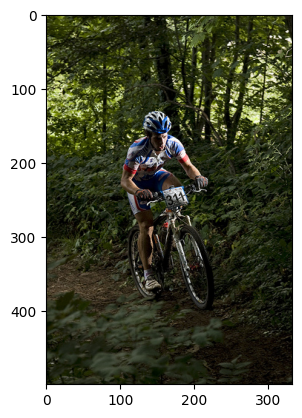

In [ ]:
generate_caption("3721082512_8277087f3f.jpg")

---------------------Actual---------------------
startseq dog is walking in tire track in the snow endseq
startseq golden dog is running along tire track that has been carved out in the snow endseq
startseq young dog walking through the snow in tire track endseq
startseq golden retriever puppy walking through snow endseq
startseq the dog is walking in the snow endseq
---------------------Predicted---------------------
startseq dog running in the snow endseq


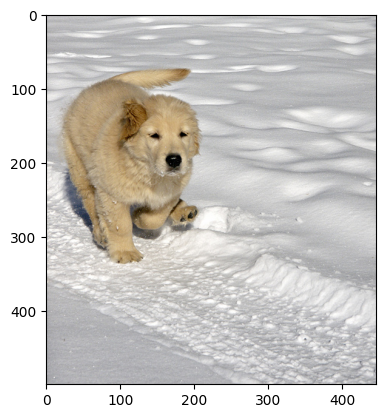

In [ ]:
generate_caption("3202360797_2084743e90.jpg")

---------------------Actual---------------------
startseq man jumps high on his yellow skateboard over the concrete tile endseq
startseq skateboarder gets airtime endseq
startseq skateboarder jumping with his skateboard endseq
startseq boy jumping in the air with skateboard endseq
startseq skateboarder in black with yellow skateboard in midair endseq
---------------------Predicted---------------------
startseq man in black coat is jumping down the air endseq


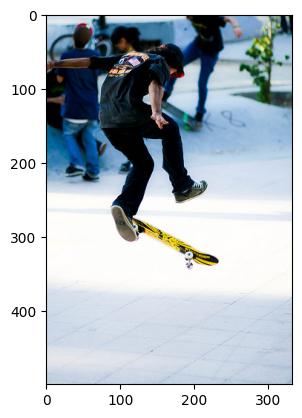

In [ ]:
generate_caption("3212465975_b657f40eed.jpg")

---------------------Actual---------------------
startseq black dog and brown dog are jumping up to catch red toy endseq
startseq black dog and brown dog play with red toy on courtyard endseq
startseq brown and black lab are outside and the black lab is catching toy in its mouth endseq
startseq black dog snaps at red and black object as brown dog lunges endseq
startseq the chocolate lab jumps too late to get the toy as the black lab captures it in the driveway endseq
---------------------Predicted---------------------
startseq two black dogs are running in the grass endseq


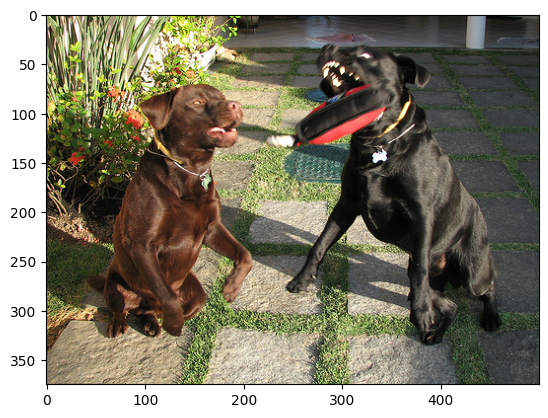

In [ ]:
generate_caption("1030985833_b0902ea560.jpg")

---------------------Actual---------------------
startseq boy with stick kneeling in front of goalie net endseq
startseq child in red jacket playing street hockey guarding goal endseq
startseq young kid playing the goalie in hockey rink endseq
startseq young male kneeling in front of hockey goal with hockey stick in his right hand endseq
startseq hockey goalie boy in red jacket crouches by goal with stick endseq
---------------------Predicted---------------------
startseq the man is standing in the air endseq


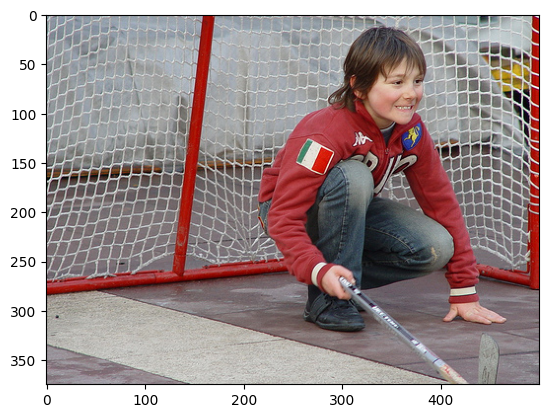

In [ ]:
generate_caption("103106960_e8a41d64f8.jpg")

---------------------Actual---------------------
startseq girl in white is rock climbing endseq
startseq woman in white shirt and black cropped pants climbs rock wall endseq
startseq young girl climbing rock wall endseq
startseq fit brunette enjoys some time rock climbing endseq
startseq the girl is climbing an artificial climbing wall endseq
---------------------Predicted---------------------
startseq young boy in blue shirt is climbing boxing boxing endseq


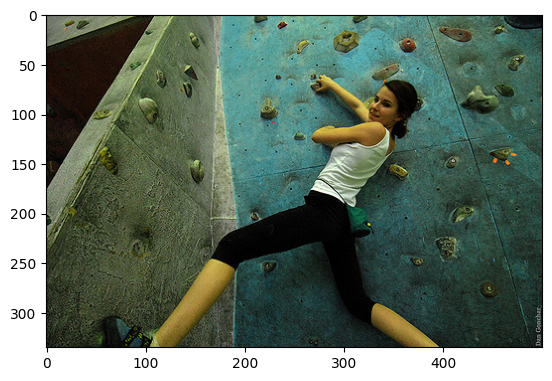

In [ ]:
generate_caption("3105623068_392b767a7b.jpg")

---------------------Actual---------------------
startseq blond child is jumping facefirst onto bed endseq
startseq little boy jumps onto bed endseq
startseq boy in black shirt jumps onto bed from dresser endseq
startseq boy is bouncing over the bed wearing black tshirt endseq
startseq little blonde boy is falling onto bed endseq
---------------------Predicted---------------------
startseq man is sitting on the doorway endseq


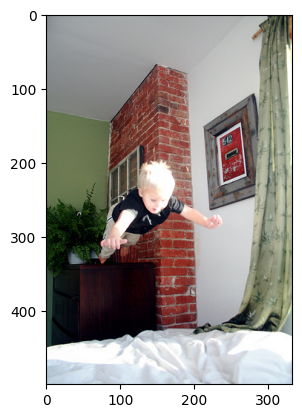

In [ ]:
generate_caption("3106791484_13e18c33d8.jpg")

---------------------Actual---------------------
startseq the two dogs are running toward the camera endseq
startseq two dogs running along dirt path endseq
startseq two dogs running down path in the woods endseq
startseq two dogs run through field endseq
startseq two long haired dogs racing down forest path endseq
---------------------Predicted---------------------
startseq two dogs are running in the grass endseq


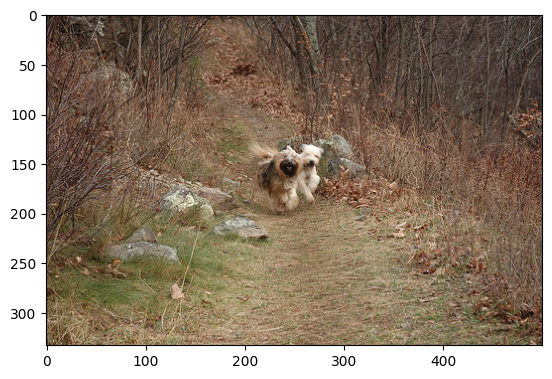

In [ ]:
generate_caption("315021440_122d56ebd7.jpg")

---------------------Actual---------------------
startseq woman in formal riding gear riding her horse on the beach endseq
startseq woman is riding brown horse on the shore of the ocean endseq
startseq woman on horseback riding on the beach endseq
startseq woman riding large brown horse on the beach endseq
startseq person on horse on the beach endseq
---------------------Predicted---------------------
startseq dog on horseback on the beach endseq


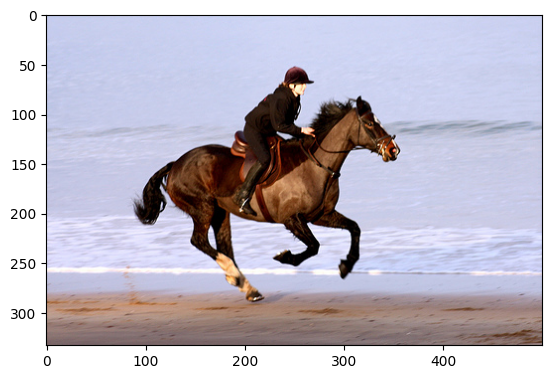

In [ ]:
generate_caption("3272002857_ace031f564.jpg")

---------------------Actual---------------------
startseq black and brown dog jumping over two white and purple stiped poles endseq
startseq dog jumps over hurdle in the grass endseq
startseq dog jumps over an obstacle endseq
startseq black and brown dog jumping over hurdle with white supports endseq
startseq dog performing during an outdoor dog show endseq
---------------------Predicted---------------------
startseq black dog jumps over hurdle endseq


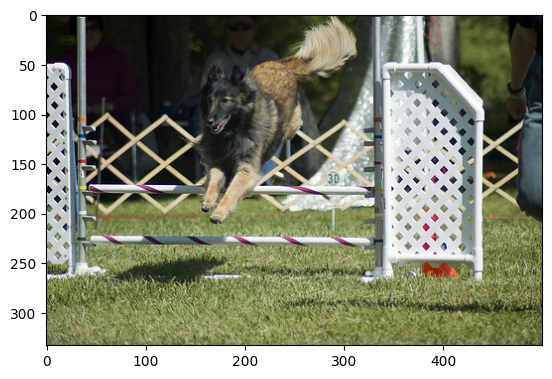

In [ ]:
generate_caption("3514019869_7de4ece2a5.jpg")

---------------------Actual---------------------
startseq boy and girl hold hands walking down railroad track endseq
startseq boy and girl hold hands as they walk on railroad tracks endseq
startseq boy in striped shirt and little girl in blue dress walk hand in hand down the train track endseq
startseq little girl and older male holding hands and walking on train tracks endseq
startseq the little girl in the blue dress is walking with man along railway track endseq
---------------------Predicted---------------------
startseq man is riding down bench endseq


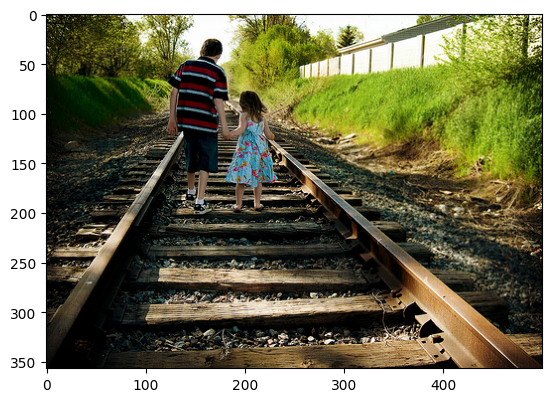

In [ ]:
generate_caption("3514188115_f51932ae5d.jpg")

####Test Images

---------------------Actual---------------------
startseq black dog jumping into lake endseq
startseq black dog with red collar is jumping in the water endseq
startseq black dog with red collar is jumping out of the water endseq
startseq black dog with red collar splashing in water endseq
startseq the black dog with red collar is jumping through the water endseq
---------------------Predicted---------------------
startseq black dog running through the water endseq


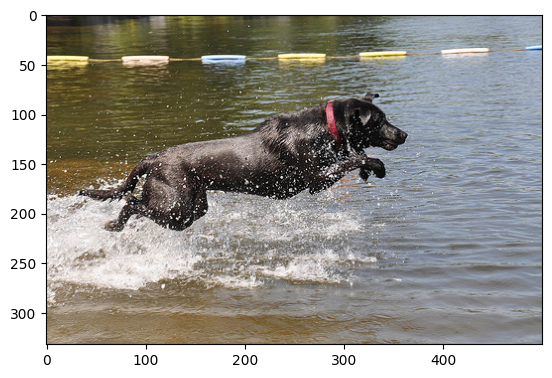

In [ ]:
generate_caption("3710520638_866d542a80.jpg")

---------------------Actual---------------------
startseq bicyclist is drinking out of bottle of water while riding endseq
startseq biker takes drink of water endseq
startseq cyclist drinks water endseq
startseq man riding bicycle drinks from bottle of water endseq
startseq person takes drink of water while riding on bike endseq
---------------------Predicted---------------------
startseq man is riding bike bike endseq


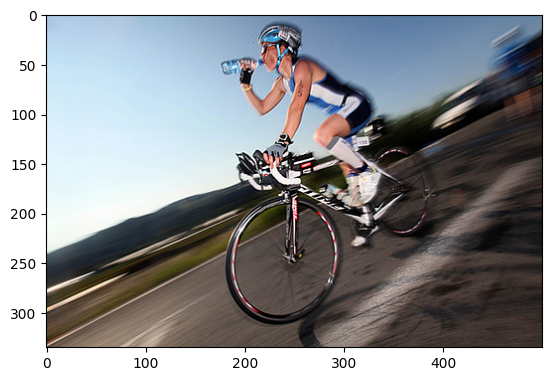

In [ ]:
generate_caption("3671933270_d124e9a1a4.jpg")

---------------------Actual---------------------
startseq man in green and black gets muddy on dirt bike endseq
startseq motocross racer in green and helmet racing in the dirt endseq
startseq person in black and green outfit is riding bicycle endseq
startseq man in green uniform riding dirt bike endseq
startseq this man is wearing green and black equipment to ride his dirt bike endseq
---------------------Predicted---------------------
startseq person in blue helmet is riding dirt bike endseq


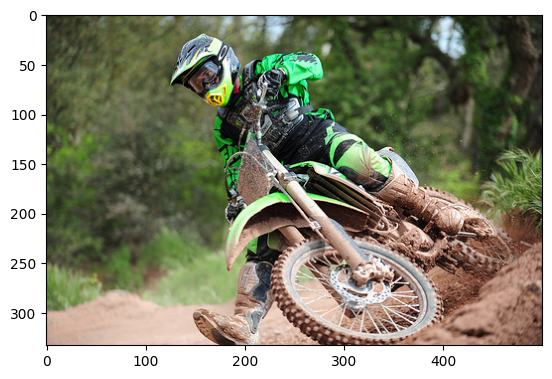

In [ ]:
generate_caption("3456862740_7550bcddc2.jpg")

---------------------Actual---------------------
startseq person holding tennis racket hits yellow tennis ball endseq
startseq tennis player hitting the ball endseq
startseq tennis player hitting the ball endseq
startseq the tennis ball is about to be hit endseq
startseq this man is hitting tennis ball with tennis racket endseq
---------------------Predicted---------------------
startseq man hits tennis ball endseq


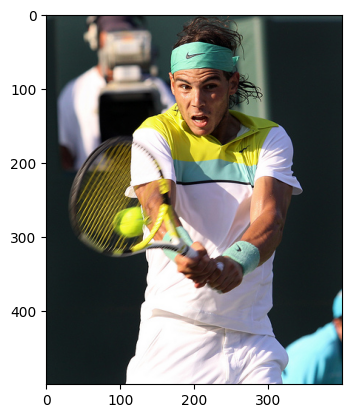

In [ ]:
generate_caption("3425887426_bf60b8afa3.jpg")

---------------------Actual---------------------
startseq boys jumps into the water upside down endseq
startseq child diving headfirst into lake endseq
startseq man is falling backward in swim gear over large body of water nearby an urban area endseq
startseq the man is going into the water endseq
startseq the person is going into the water endseq
---------------------Predicted---------------------
startseq man in blue suit is jumping into the air endseq


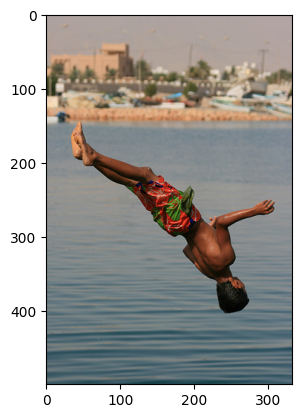

In [ ]:
generate_caption("3667492609_97f88b373f.jpg")

---------------------Actual---------------------
startseq man in crowd wears red hat and red bandanna over his face endseq
startseq person with dreadlocks and red hat with their face covered by red bandanna endseq
startseq woman wearing hat and red scarf stands among others wearing similar clothes endseq
startseq woman wearing red hat and red bandanna followed by man in red bandanna endseq
startseq the lady is wearing bandanna around her face to protect her from dust endseq
---------------------Predicted---------------------
startseq woman in red hat and red hat and red hat and red hat and red hat and red hat and red hat and red hat and red hat and red hat and red hat


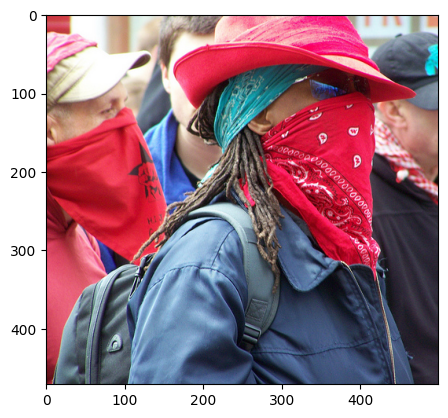

In [ ]:
generate_caption("3503623999_bbd5dcfb18.jpg")

---------------------Actual---------------------
startseq boy in grey hat is carrying soccer ball by reddish colored wall endseq
startseq child dressed in blue shirt and cap is carrying soccer ball endseq
startseq little boy is holding soccer ball endseq
startseq small boy is carrying soccer ball endseq
startseq small child wearing hat and coat holding large ball endseq
---------------------Predicted---------------------
startseq man in blue shirt is playing in the air endseq


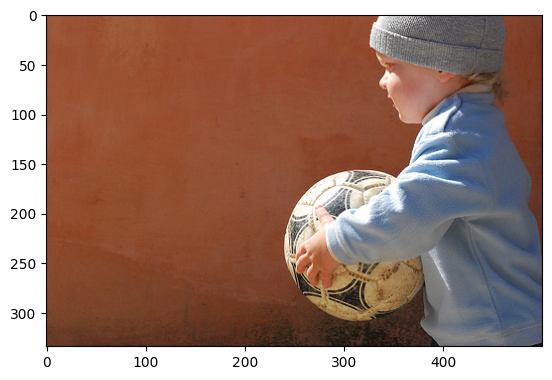

In [ ]:
generate_caption("3475552729_a3abd81ee6.jpg")

---------------------Actual---------------------
startseq guy in yellow shirt with bike gets very high in the air endseq
startseq man in midair holding his bike handlebars endseq
startseq man is performing trick high in the air with bicycle endseq
startseq man wearing yellow shirt is doing trick high in the air with his bike endseq
startseq man holding onto bike handlebars while in midair endseq
---------------------Predicted---------------------
startseq person is airborne in the air endseq


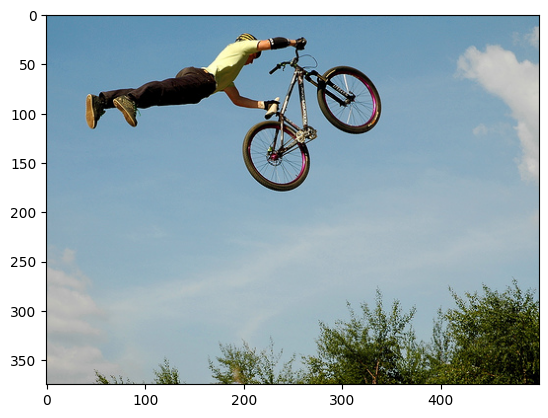

In [ ]:
generate_caption("2520909293_9bb7f7364e.jpg")

---------------------Actual---------------------
startseq two guitarists dressed in white perform endseq
startseq two guitar players dressed in white endseq
startseq two men in white suits play the guitar on stage endseq
startseq two men wearing all white kneel on the floor palying guitar endseq
startseq two men wearing white suits play guitar onstage endseq
---------------------Predicted---------------------
startseq man in white shirt and woman are standing in the street endseq


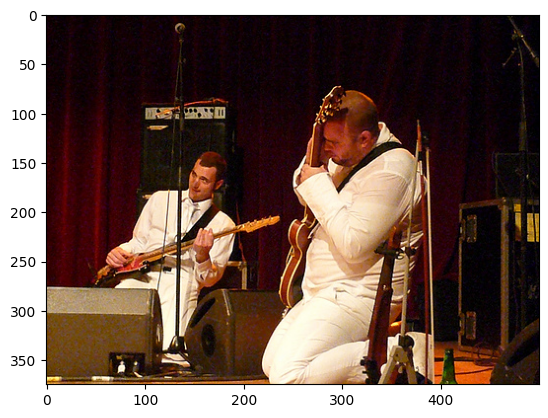

In [ ]:
generate_caption("3326588088_172d1b2584.jpg")

---------------------Actual---------------------
startseq man skis on snowy mountain endseq
startseq person skis down steep snowy hill endseq
startseq skier skiing down snowy mountainside endseq
startseq skier speeds through the snow endseq
startseq the skier is descending the hill whilst wearing silver helmet and red backpack endseq
---------------------Predicted---------------------
startseq person in red coat is skiing down snowy mountain endseq


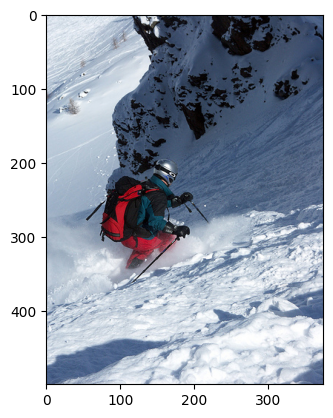

In [ ]:
generate_caption("511844627_0ec78e01e9.jpg") #greedy

---------------------Actual---------------------
startseq black dog playing with purple toy in the snow endseq
startseq black dog runs through the snow carrying blue toy endseq
startseq dog plays in the snow endseq
startseq dog running with purple toy in the snowy field endseq
startseq the black and brown dog carries purple toy in the snow endseq
---------------------Predicted---------------------
startseq black dog is running through the snow endseq


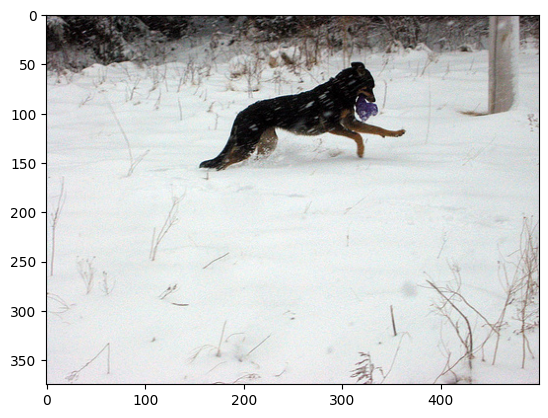

In [ ]:
generate_caption("447800028_0242008fa3.jpg") #ok